# PS3E20 | Predict CO2 Emissions in Rwanda
### 86th Place Solution [1,440 teams]
<br>

## Introduction

- In this competition, we have to forecast emission in multiple locations in Rwanda in 2022. We are using historical data from 2019 until 2021 to train our models. 
- Time-series problem.
- Geo-data plays vital role in this competition.

My references:
- https://www.kaggle.com/code/kacperrabczewski/rwanda-co2-step-by-step-guide
- https://www.kaggle.com/code/iqbalsyahakbar/ps3e20-time-series-for-beginners

Tags
- Time series
- Regression
- Clustering as feature
- Date Features

Competition link:
- https://www.kaggle.com/competitions/playground-series-s3e20/

## Loading Libraries

In [1]:
import numpy as np
import pandas as pd

from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform

#Visualization
import plotly.graph_objs as go
import plotly.express as px
import plotly.io as pio
import plotly.figure_factory as ff
pd.options.plotting.backend = "plotly"

import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

from tqdm import tqdm
tqdm.pandas()

import time
import pickle
import json

from holidays import CountryHoliday

from sklearn.cluster import KMeans

from sklearn.metrics import mean_squared_error

from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline, Pipeline

from sklearn.linear_model import Ridge, Lasso
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.ensemble import HistGradientBoostingRegressor, VotingRegressor, StackingRegressor, AdaBoostRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor



In [2]:
# from flaml.automl.model import ExtraTreesRegressor,RandomForestEstimator,XGBoostEstimator,XGBoostLimitDepthEstimator,LGBMRegressor,CatBoostEstimator
# from flaml.automl.model import XGBoostLimitDepthEstimator

## Global Helper Tools

In [37]:
def similar_cols(match_str, df):
    return [i for i in df.columns if match_str in i]

def descriptive_df(df):
    pd.options.display.max_columns = None
    display(df)
    pd.options.display.max_columns = 20
    
def descriptive_df_rows(df):
    pd.options.display.max_rows = None
    display(df)
    pd.options.display.max_rows = 20

def descriptive_statistics(df):
    pd.options.display.max_rows = len(df.columns)
    desc = pd.DataFrame(index = list(df))
    desc['count'] = df.count()
    desc['nunique'] = df.nunique()
    desc['%unique'] = (desc['nunique'] / len(df)) * 100
    desc['null'] = df.isnull().sum()
    desc['%null'] = (desc['null'] / len(df)) * 100
    desc['type'] = df.dtypes
    desc = pd.concat([desc, df.describe().T.drop('count', axis = 1)], axis = 1)
    display(desc.style.bar(subset=['%unique', '%null'],color='lightgreen', vmax=100).highlight_max())
    pd.options.display.max_rows = 60

## Reading Data

In [3]:
train_df = pd.read_csv('data/train.csv')
test_df = pd.read_csv('data/test.csv')

In [4]:
train_df.head()

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
0,ID_-0.510_29.290_2019_00,-0.51,29.29,2019,0,-0.000108,0.603019,-0.000065,0.255668,-98.593887,...,3664.436218,61085.809570,2615.120483,15.568533,0.272292,-12.628986,35.632416,-138.786423,30.752140,3.750994
1,ID_-0.510_29.290_2019_01,-0.51,29.29,2019,1,0.000021,0.728214,0.000014,0.130988,16.592861,...,3651.190311,66969.478735,3174.572424,8.690601,0.256830,30.359375,39.557633,-145.183930,27.251779,4.025176
2,ID_-0.510_29.290_2019_02,-0.51,29.29,2019,2,0.000514,0.748199,0.000385,0.110018,72.795837,...,4216.986492,60068.894448,3516.282669,21.103410,0.251101,15.377883,30.401823,-142.519545,26.193296,4.231381
3,ID_-0.510_29.290_2019_03,-0.51,29.29,2019,3,NaN,NaN,NaN,NaN,NaN,...,5228.507736,51064.547339,4180.973322,15.386899,0.262043,-11.293399,24.380357,-132.665828,28.829155,4.305286
4,ID_-0.510_29.290_2019_04,-0.51,29.29,2019,4,-0.000079,0.676296,-0.000048,0.121164,4.121269,...,3980.598120,63751.125781,3355.710107,8.114694,0.235847,38.532263,37.392979,-141.509805,22.204612,4.347317


In [5]:
train_df.drop('ID_LAT_LON_YEAR_WEEK', axis = 1, inplace = True, errors='ignore')
train_df['timeStamp'] = pd.to_datetime(train_df['year'].astype(str)+ '-' + train_df['week_no'].astype(str) + '-2', format='%Y-%W-%w')
train_df.sort_values(by='timeStamp',inplace=True)

In [6]:
locations = train_df[['latitude', 'longitude']].drop_duplicates()
print(f'There are total {locations.shape[0]} locations')

There are total 497 locations


## Descriptive Statistics

In [38]:
descriptive_statistics(train_df)

,count,nunique,%unique,null,%null,type,mean,std,min,25%,50%,75%,max
latitude,79023,452,0.571985,0,0.000000,float64,-1.891072,0.694522,-3.299000,-2.451000,-1.882000,-1.303000,-0.510000
longitude,79023,453,0.573251,0,0.000000,float64,29.880155,0.810375,28.228000,29.262000,29.883000,30.471000,31.532000
year,79023,3,0.003796,0,0.000000,int64,2020.000000,0.816502,2019.000000,2019.000000,2020.000000,2021.000000,2021.000000
week_no,79023,53,0.067069,0,0.000000,int64,26.000000,15.297155,0.000000,13.000000,26.000000,39.000000,52.000000
SulphurDioxide_SO2_column_number_density,64414,64409,81.506650,14609,18.487023,float64,0.000048,0.000272,-0.000996,-0.000096,0.000024,0.000153,0.004191
SulphurDioxide_SO2_column_number_density_amf,64414,64411,81.509181,14609,18.487023,float64,0.834848,0.185382,0.241822,0.705817,0.809118,0.942792,1.885239
SulphurDioxide_SO2_slant_column_number_density,64414,64409,81.506650,14609,18.487023,float64,0.000035,0.000206,-0.000887,-0.000078,0.000019,0.000121,0.004236
SulphurDioxide_cloud_fraction,64414,62367,78.922592,14609,18.487023,float64,0.158418,0.071364,0.000000,0.110535,0.161855,0.211824,0.299998
SulphurDioxide_sensor_azimuth_angle,64414,64295,81.362388,14609,18.487023,float64,-7.925870,64.263368,-179.537059,-56.782383,-12.441726,72.059990,122.095200
SulphurDioxide_sensor_zenith_angle,64414,64218,81.264948,14609,18.487023,float64,37.436189,14.149950,0.099237,28.844520,37.784299,47.634875,66.242012


- There is no categorical feature in dataset.In "UvAerosolLayerHeight" Features >99 % of data is missing.So, it would be better to drop the columns which are related to "UvAerosolLayerHeight".

## Visualization

### Emission Trend

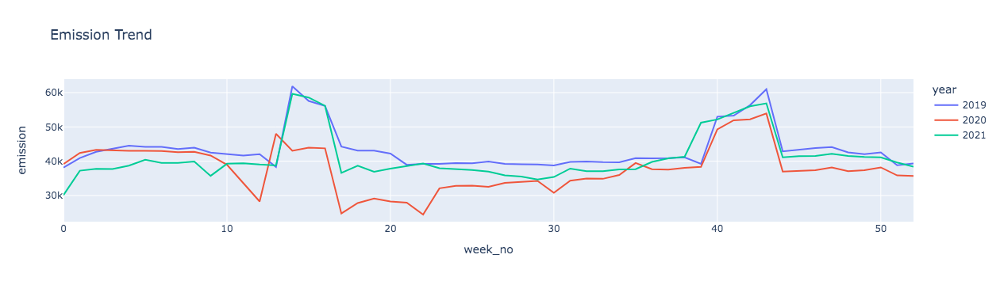

In [9]:
train_df.groupby(['week_no','year'])['emission'].sum().reset_index().plot(kind='line',x='week_no',y='emission', title='Emission Trend',color='year')


- There is covid impact on emission trend.

### Fixing Covid year with giving label covid_impact

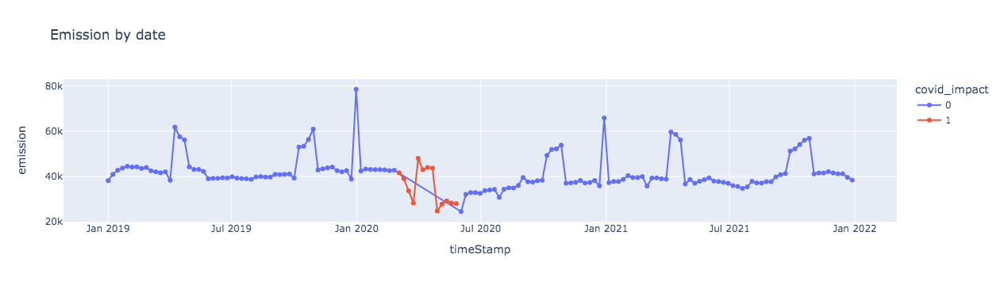

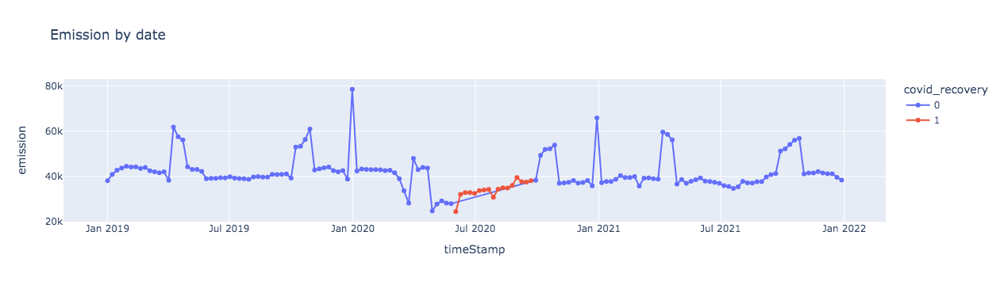

In [10]:
# https://medium.com/@jorritsandbrink/how-covid-19-messed-up-our-time-series-6d84516f80c0

train_df['covid_impact'] = train_df[['year', 'week_no']].apply(lambda x:1 if (x['year']==2020 and (x['week_no'] in range(9,22))) else 0,axis=1)
train_df['covid_recovery'] = train_df[['year', 'week_no']].apply(lambda x:1 if (x['year']==2020 and (x['week_no'] in range(22,39))) else 0,axis=1)
display(train_df.groupby(['timeStamp','covid_impact','covid_recovery'])['emission'].sum().reset_index().plot(kind='line', x='timeStamp', y='emission', title='Emission by date', markers=True, color='covid_impact'))
display(train_df.groupby(['timeStamp','covid_impact','covid_recovery'])['emission'].sum().reset_index().plot(kind='line', x='timeStamp', y='emission', title='Emission by date', markers=True, color='covid_recovery'))


### Correlation

In [11]:
corr = train_df.corr()

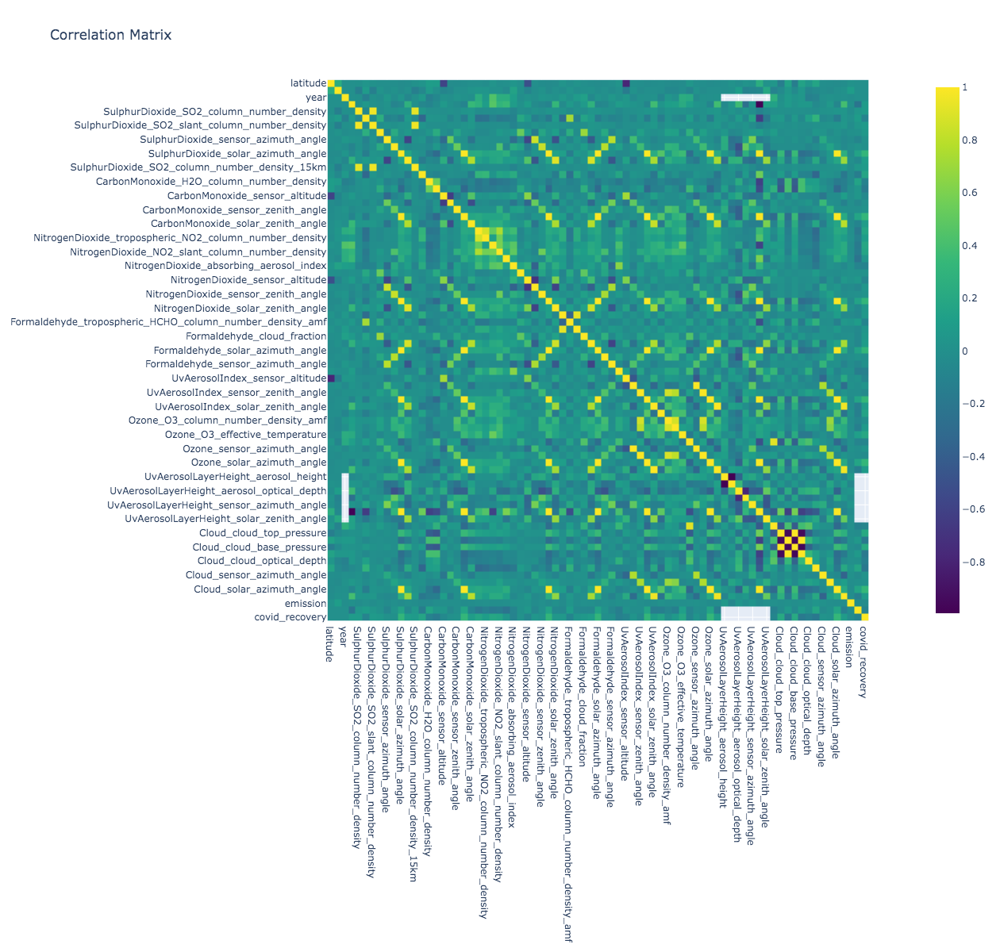

In [12]:
corr.plot(kind='imshow',title='Correlation Matrix',color_continuous_scale='viridis',height=1200,width=1200)

- There is lot of things going in this Visualization. We can try to use hierarchial clustering to simplify the information.

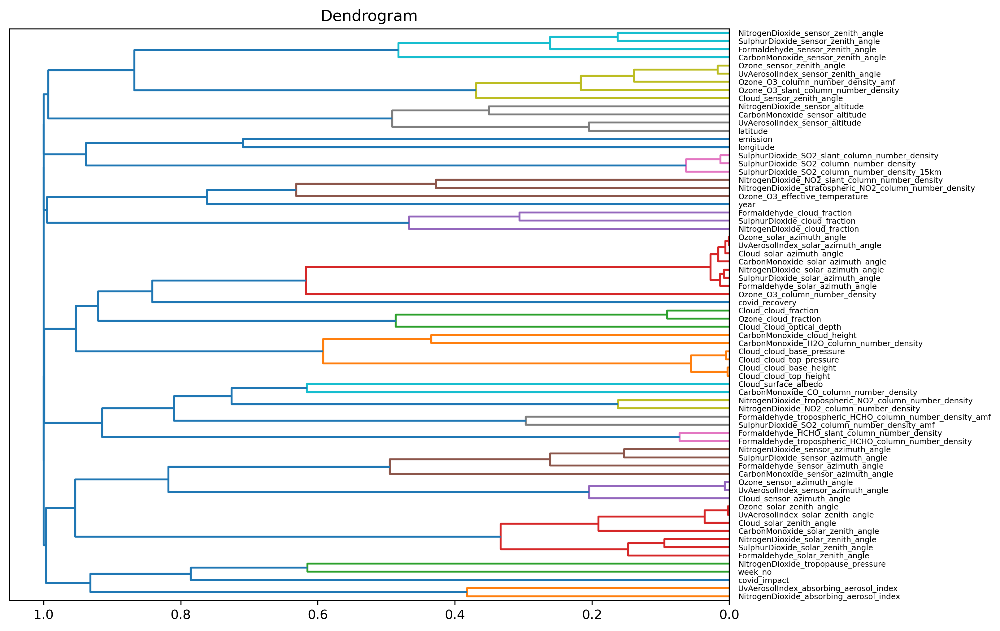

In [13]:
uv_cols =[i for i in train_df.columns if 'UvAerosolLayerHeight' in i]
train_df.drop(uv_cols, axis=1, inplace=True, errors='ignore')

corr = train_df.corr(method = 'spearman')
dist_linkage = linkage(squareform(1 - abs(corr)), 'complete')

plt.figure(figsize = (10, 8),dpi=300)
dendro = dendrogram(dist_linkage, labels=corr.columns, orientation='left' )
plt.title(f'Dendrogram')
plt.show()

- Now we can see which features are correlated and which aren't.

## Clustering locations

Emission is different for each location and sometimes it depends on regions. So, Lets's cluster them.

In [14]:
emission_series = train_df[train_df.year != 2020].pivot_table(index=['year','week_no'], columns=['longitude','latitude'], values='emission')
emission_series = (emission_series-emission_series.min())/(emission_series.max()-emission_series.min())
emission_series = emission_series.dropna(axis=1)


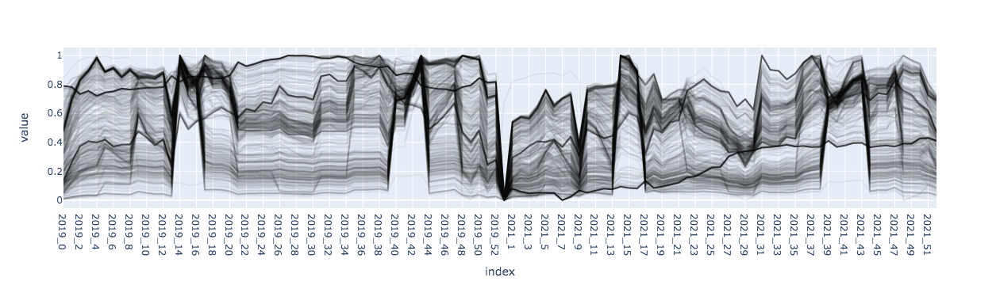

In [15]:
new_emission_series = emission_series.copy()
new_index = [str(i[0])+'_'+str(i[1]) for i in new_emission_series.index]
new_cols = [str(i[0])+'_'+str(i[1]) for i in new_emission_series.columns]
new_emission_series.index = new_index
new_emission_series.columns = new_cols
new_emission_series.plot().update_traces(line_color="black", opacity=0.05, showlegend=False)

 Clearly we can see different groups

In [16]:
print(f"In total of {train_df.drop_duplicates(['longitude','latitude']).shape[0]} locations {emission_series.shape[1]} are uesd for clustering others have same value (here it is 0)no need to predict for.")


In total of 497 locations 482 are uesd for clustering others have same value (here it is 0)no need to predict for.


### Kmeans

In [17]:
new_emission_series = new_emission_series.T

kmeans_model = KMeans(n_clusters=13,max_iter=10000,random_state=42)
kmeans_model.fit(new_emission_series)

new_emission_series['cluster'] = kmeans_model.labels_

******************** For cluster 0 ********************
Group size 49


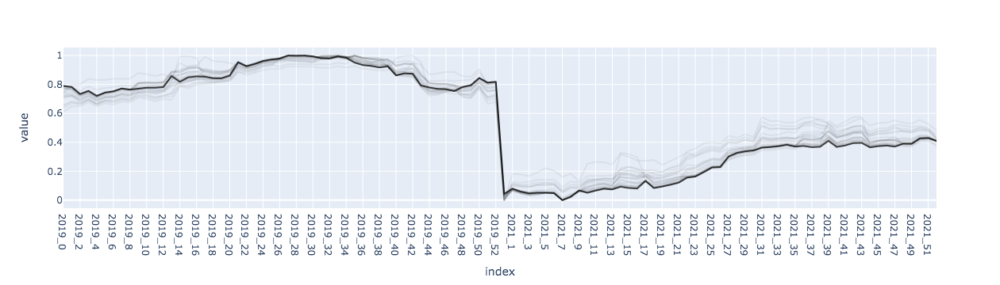

******************** For cluster 1 ********************
Group size 69


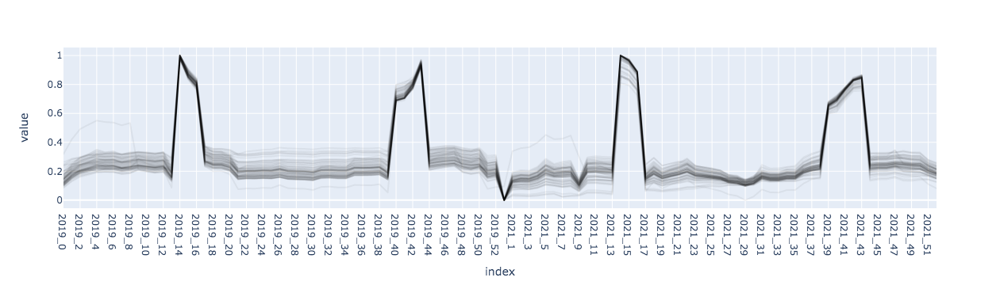

******************** For cluster 2 ********************
Group size 17


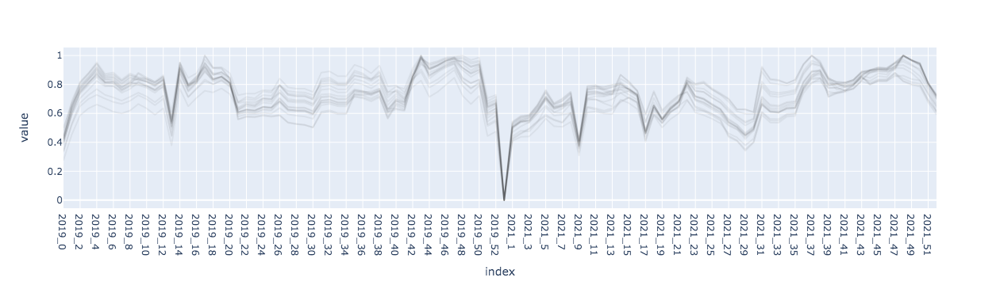

******************** For cluster 3 ********************
Group size 83


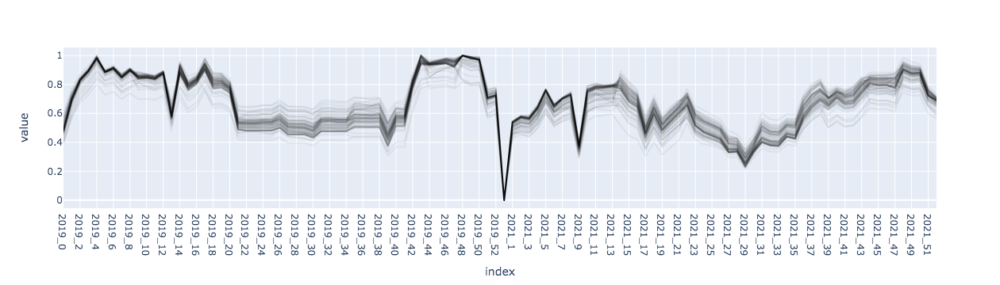

******************** For cluster 4 ********************
Group size 43


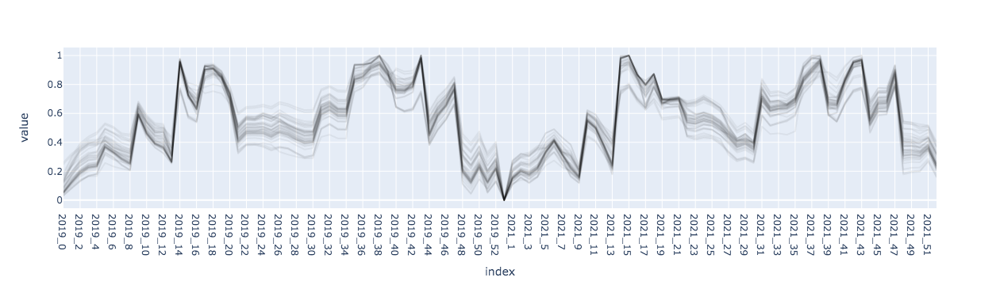

******************** For cluster 5 ********************
Group size 40


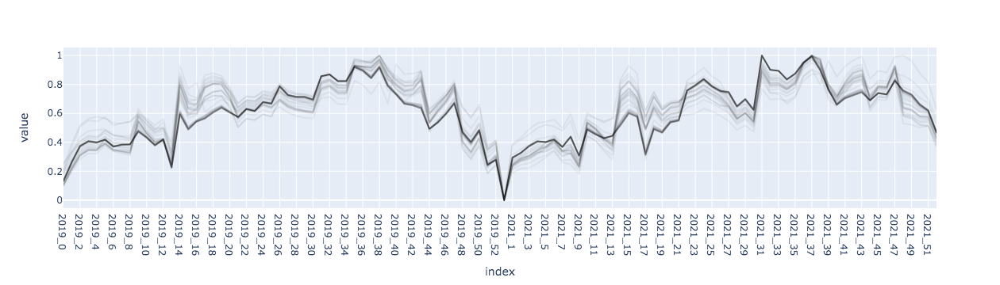

******************** For cluster 6 ********************
Group size 50


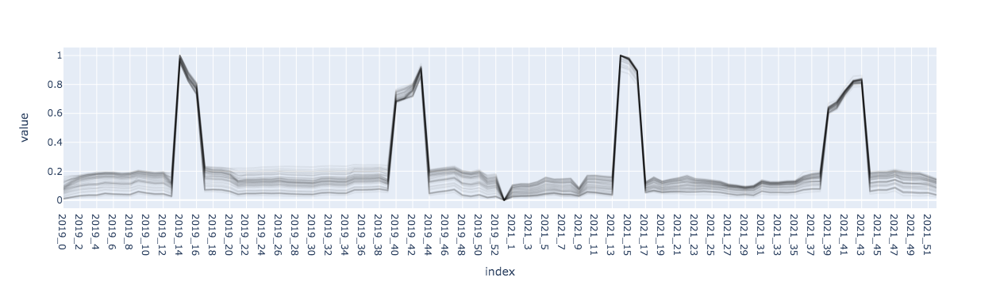

******************** For cluster 7 ********************
Group size 17


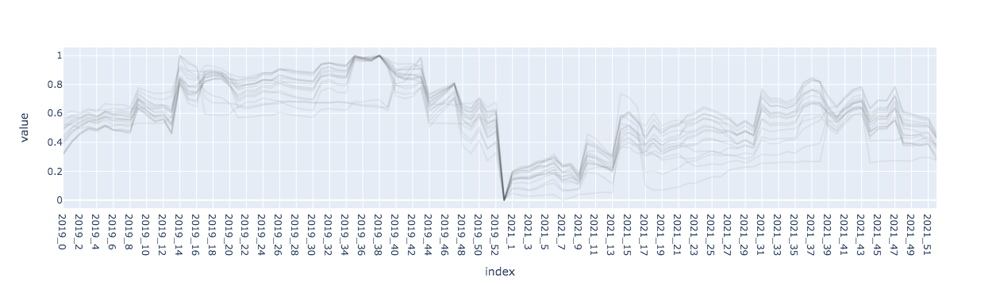

******************** For cluster 8 ********************
Group size 9


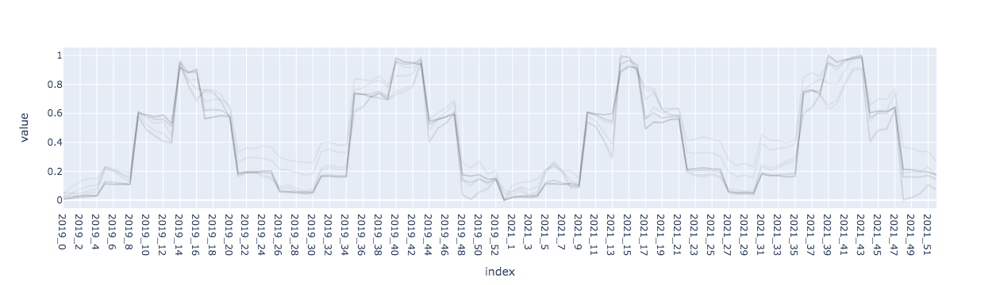

******************** For cluster 9 ********************
Group size 21


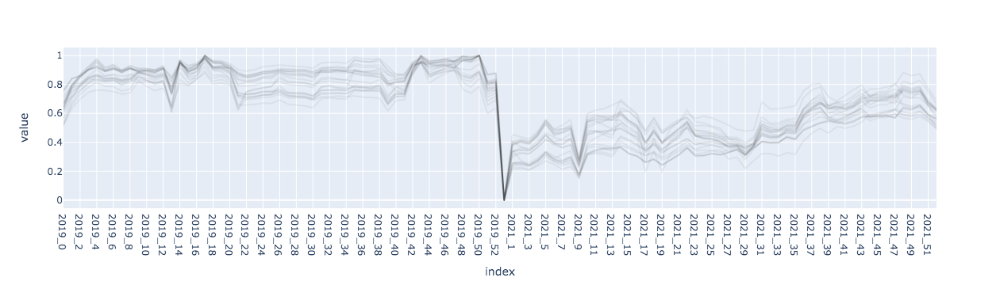

******************** For cluster 10 ********************
Group size 1


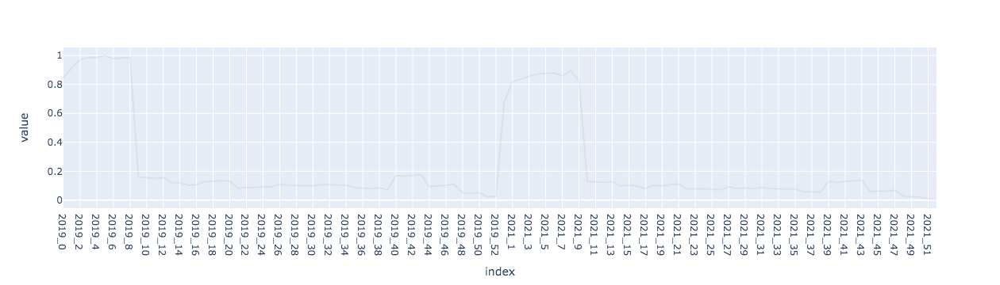

******************** For cluster 11 ********************
Group size 48


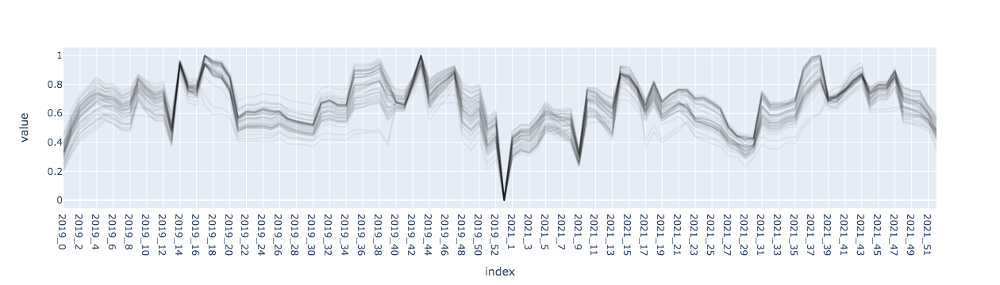

******************** For cluster 12 ********************
Group size 35


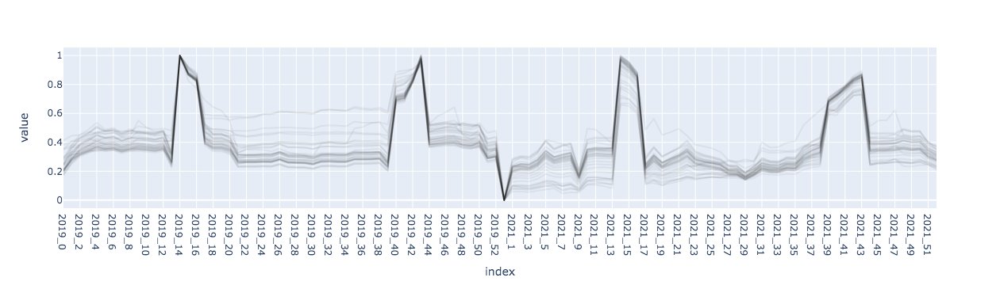

In [18]:
for cluster in new_emission_series['cluster'].sort_values().unique():
    print(f"{'*'*20} For cluster {cluster} {'*'*20}")
    df_plot = new_emission_series[new_emission_series['cluster']==cluster].T.drop('cluster')
    print(f'Group size {df_plot.shape[1]}')
    display(df_plot.plot().update_traces(line_color="black", opacity=0.05, showlegend=False))
    time.sleep(0.5)


In [19]:
cluster_dict = new_emission_series['cluster'].to_dict()

## Feature Engineering

In [20]:
train_df['long_lat'] = train_df[['longitude', 'latitude']].apply(lambda x:str(x[0])+'_'+str(x[1]),axis=1)
emission_max_dict = train_df[['long_lat', 'week_no', 'emission']].groupby(['long_lat', 'week_no'])['emission'].max().to_dict()
holidays = CountryHoliday('BI', years=[2019,2020,2021,2022]) # Using Burindi holidays as Rwanda holidays not available in holidays package
holidays_cols = ["New Year's Day", 'Unity Day', 'President Ntaryamira Day', 'Labour Day', 'Ascension Day', 'Eid ul Fitr* (*estimated)', 
                 'Independence Day', 'Eid al Adha* (*estimated)', 'Eid al Adha* (*estimated) (Observed)', 'Assumption Day', 
                 'Prince Louis Rwagasore Day', 'Prince Louis Rwagasore Day (Observed)', "President Ndadaye's Day", "All Saints' Day", 
                 'Christmas Day', 'Eid ul Fitr* (*estimated) (Observed)', "All Saints' Day (Observed)", 'Ascension Day; Eid ul Fitr* (*estimated)', 
                 'Assumption Day (Observed)']

In [21]:
def get_holidays_per_week(date):
    holiday_dict = {}
    for holiday_date, holiday in holidays.items():
        if (holiday_date >= date) and (holiday_date < (date + pd.DateOffset(7))):
            if holiday in holiday_dict.keys():
                holiday_dict[holiday] +=1
            else:
                holiday_dict[holiday] = 1 
    return holiday_dict

In [22]:
train_df.drop('ID_LAT_LON_YEAR_WEEK', axis = 1, inplace = True, errors='ignore')
train_df['timeStamp'] = pd.to_datetime(train_df['year'].astype(str)+ '-' + train_df['week_no'].astype(str) + '-2', format='%Y-%W-%w')
train_df.sort_values(by='timeStamp',inplace=True)

In [23]:
def data_processor(x):
    x_copy = x.copy()
    
    x_copy['timeStamp'] = pd.to_datetime(x_copy['year'].astype(str)+ '-' + x_copy['week_no'].astype(str) + '-2', format='%Y-%W-%w')
    
    # Covid Impact
    x_copy['covid_impact'] = x_copy.apply(lambda x:1 if (x['year']==2020 and (x['week_no'] in range(9,22))) else 0,axis=1)
    # Covid Recovery
    x_copy['covid_recovery'] = x_copy.apply(lambda x:1 if (x['year']==2020 and (x['week_no'] in range(22,39))) else 0,axis=1)
    
    x_copy['long_lat'] = x_copy[['longitude', 'latitude']].apply(lambda x:str(x[0])+'_'+str(x[1]),axis=1)
    # Clustering
    x_copy['cluster'] = x_copy['long_lat'].apply(lambda x:cluster_dict.get(x, max(cluster_dict.values())+1))
    
    # x_copy['emission_max'] = x_copy[['long_lat','week_no']].progress_apply(lambda x:emission_max_dict.get((x[0],x[1])),axis=1)
    
    # Cyclic features
    x_copy['week_sin'] = np.sin(2 * np.pi * x_copy['week_no']/53)
    x_copy['week_cos'] = np.cos(2 * np.pi * x_copy['week_no']/53)
    
    # Rotating Location
    x_copy['rot_15_x'] = (np.cos(np.radians(15)) * x_copy['longitude']) + (np.sin(np.radians(15)) * x_copy['latitude'])
    x_copy['rot_15_y'] = (np.cos(np.radians(15)) * x_copy['latitude']) + (np.sin(np.radians(15)) * x_copy['longitude'])
    x_copy['rot_30_x'] = (np.cos(np.radians(30)) * x_copy['longitude']) + (np.sin(np.radians(30)) * x_copy['latitude'])
    x_copy['rot_30_y'] = (np.cos(np.radians(30)) * x_copy['latitude']) + (np.sin(np.radians(30)) * x_copy['longitude'])
    
    # Date Features
    x_copy['Year_Nb'] = (x_copy['timeStamp'].dt.year - 2019).astype(np.int8)
    x_copy['Qtr_Nb'] = x_copy['timeStamp'].dt.quarter.astype(np.int8)
    x_copy['Month_Nb'] = x_copy['timeStamp'].dt.month.astype(np.int8)
    x_copy['Month_Sin'] = (np.sin(x_copy['Month_Nb'] * (2 * np.pi / 12))).astype(np.float32)
    x_copy['Week_Nb'] = np.clip(x_copy['timeStamp'].dt.week, a_min = 0, a_max= 52)
    # x_copy['Weekday_Nb'] = x_copy['timeStamp'].dt.dayofweek.astype(np.int8);
    # x_copy['Is_Weekend'] = np.where(x_copy['Weekday_Nb'] >= 5,1,0)
    
    # Holiday Features
    x_copy['holidays'] = x_copy['timeStamp'].progress_apply(get_holidays_per_week)
    holidays_df = pd.DataFrame(x_copy['holidays'].to_list(), columns=holidays_cols).fillna(0)
    holidays_df.index = x_copy.index
    x_copy = pd.concat([x_copy, holidays_df],axis=1)
    
    x_copy['no_of_holidays'] = x_copy[holidays_cols].sum(axis=1)
    
    return x_copy

DataProcessor = FunctionTransformer(data_processor)

In [24]:
def feature_dropper(x):
    return x[['timeStamp', 'latitude', 'longitude', 'week_sin', 'week_cos', 
              'rot_15_x', 'rot_15_y', 'rot_30_x', 'rot_30_y', 
              'covid_impact', 'covid_recovery', 'cluster',
             'Year_Nb','Week_Nb','Qtr_Nb','no_of_holidays']]

FeatureDropper = FunctionTransformer(feature_dropper)

In [25]:
OneHotCols = ['Qtr_Nb', 'Week_Nb']

In [26]:
one_hot_encoder = ColumnTransformer(transformers=[('encoder', OneHotEncoder(), OneHotCols)],remainder='passthrough',sparse_threshold=0)


## CV function

In [27]:
seed = 42
k = LeaveOneGroupOut()

In [28]:
def cross_val_score(model, cv = k, label = ''):
    print(f'{"*"*25} {label} {"*"*25}')
    #initiate prediction arrays and score lists
    val_predictions = np.zeros((len(X)))
    #train_predictions = np.zeros((len(X)))
    train_scores, val_scores = [], []
    
    #training model, predicting prognosis probability, and evaluating log loss
    for fold, (train_idx, val_idx) in tqdm(enumerate(cv.split(X, y, X.year))):
        
        #define train set
        X_train = X.iloc[train_idx]
        y_train = y.iloc[train_idx]
        
        #define validation set
        X_val = X.iloc[val_idx]
        y_val = y.iloc[val_idx]
        
        #train model
        model.fit(X_train, y_train)
        
        #make predictions
        train_preds = model.predict(X_train)
        val_preds = model.predict(X_val)
                  
        val_predictions[val_idx] += val_preds
        
        #evaluate model for a fold
        train_score = mean_squared_error(y_train, train_preds, squared = False)
        val_score = mean_squared_error(y_val, val_preds, squared = False)
        
        #append model score for a fold to list
        train_scores.append(train_score)
        val_scores.append(val_score)
    
    print(f'Val Score: {np.mean(val_scores):.5f} ± {np.std(val_scores):.5f} | Train Score: {np.mean(train_scores):.5f} ± {np.std(train_scores):.5f} | {label}')
    
    return val_scores, val_predictions

## Pipeline

In [29]:
preprocessor = make_pipeline(DataProcessor, FeatureDropper)

## X & y

In [30]:
X = preprocessor.fit_transform(train_df)
X = one_hot_encoder.fit_transform(X)
X = pd.DataFrame(X, columns=[i.split('__')[1] for i in one_hot_encoder.get_feature_names_out()])
y = train_df['emission']

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 79023/79023 [00:45<00:00, 1753.88it/s]


## Feature Importance

In [31]:
rf_model = RandomForestRegressor()

In [32]:
rf_model.fit(X.drop('timeStamp',axis=1), y)

RandomForestRegressor()

In [39]:
feat_importance_df = pd.DataFrame(rf_model.feature_importances_, columns=['importance'])
feat_importance_df['column'] = rf_model.feature_names_in_
feat_importance_df['importance'] = feat_importance_df.importance.apply(lambda x:round(x,4))
feat_importance_df = feat_importance_df.sort_values(by='importance', ascending=False)

In [40]:
descriptive_df_rows(feat_importance_df)

,importance,column
57,0.5436,longitude
66,0.2026,cluster
63,0.0582,rot_30_y
56,0.0450,latitude
0,0.0365,Qtr_Nb_1
61,0.0264,rot_15_y
59,0.0222,week_cos
58,0.0212,week_sin
60,0.0170,rot_15_x
62,0.0143,rot_30_x


In [62]:
descriptive_df(X)

,Qtr_Nb_1,Qtr_Nb_2,Qtr_Nb_3,Qtr_Nb_4,Week_Nb_1,Week_Nb_2,Week_Nb_3,Week_Nb_4,Week_Nb_5,Week_Nb_6,Week_Nb_7,Week_Nb_8,Week_Nb_9,Week_Nb_10,Week_Nb_11,Week_Nb_12,Week_Nb_13,Week_Nb_14,Week_Nb_15,Week_Nb_16,Week_Nb_17,Week_Nb_18,Week_Nb_19,Week_Nb_20,Week_Nb_21,Week_Nb_22,Week_Nb_23,Week_Nb_24,Week_Nb_25,Week_Nb_26,Week_Nb_27,Week_Nb_28,Week_Nb_29,Week_Nb_30,Week_Nb_31,Week_Nb_32,Week_Nb_33,Week_Nb_34,Week_Nb_35,Week_Nb_36,Week_Nb_37,Week_Nb_38,Week_Nb_39,Week_Nb_40,Week_Nb_41,Week_Nb_42,Week_Nb_43,Week_Nb_44,Week_Nb_45,Week_Nb_46,Week_Nb_47,Week_Nb_48,Week_Nb_49,Week_Nb_50,Week_Nb_51,Week_Nb_52,timeStamp,latitude,longitude,week_sin,week_cos,rot_15_x,rot_15_y,rot_30_x,rot_30_y,covid_impact,covid_recovery,cluster,Year_Nb,no_of_holidays
0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2019-01-01,-0.51,29.29,0.0,1.0,28.15997,7.088188,25.110884,14.203327,0,0,2,0,1.0
1,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2019-01-01,-2.712,29.488,0.0,1.0,27.781304,5.012465,24.181357,12.395339,0,0,2,0,1.0
2,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2019-01-01,-1.932,31.068,0.0,1.0,29.509345,6.174821,25.939677,13.860839,0,0,8,0,1.0
3,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2019-01-01,-1.846,29.554,0.0,1.0,28.069192,5.866039,24.671515,13.178317,0,0,1,0,1.0
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2019-01-01,-2.924,29.976,0.0,1.0,28.197806,4.933993,24.497978,12.455742,0,0,11,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79018,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2021-12-28,-2.7,29.5,-0.118273,0.992981,27.796,5.027162,24.197749,12.411731,0,0,1,2,1.0
79019,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2021-12-28,-1.938,31.362,-0.118273,0.992981,29.791774,6.245119,26.191289,14.002643,0,0,8,2,1.0
79020,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2021-12-28,-0.798,29.402,-0.118273,0.992981,28.193614,6.838989,25.063879,14.009912,0,0,0,2,1.0
79021,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2021-12-28,-1.536,28.364,-0.118273,0.992981,26.999974,5.857481,23.795945,12.851785,0,0,0,2,1.0


## Automl Methods

### FLAML

In [34]:
from flaml import AutoML

In [57]:
automl_settings = {
    # 'time_budget': 0.1*60*60,
    'metric': 'mae',
    "task": 'regression',  # task type
    # "task": 'ts_forecast',  # task type
    # "period": 12,  # key word argument 'period' must be included for forecast task) #months
    "eval_method": "holdout",  # validation method can be chosen from ['auto', 'holdout', 'cv']
    "seed": 42,  # random seed
    'model_history': True,
    "log_file_name": "automl_logs/CO2_forecast.log",  # flaml log file
}

In [58]:
automl = AutoML(**automl_settings)

In [59]:
automl.fit(X_train=X, y_train=y, ensemble=True)

[flaml.automl.logger: 09-13 11:50:39] {1679} INFO - task = regression
[flaml.automl.logger: 09-13 11:50:39] {1690} INFO - Evaluation method: holdout
[flaml.automl.logger: 09-13 11:50:39] {1788} INFO - Minimizing error metric: mae
[flaml.automl.logger: 09-13 11:50:39] {1811} WARNING - No search budget is provided via time_budget or max_iter. Training only one model per estimator. Zero-shot AutoML is used for certain tasks and estimators. To tune hyperparameters for each estimator, please provide budget either via time_budget or max_iter.
[flaml.automl.logger: 09-13 11:50:39] {1900} INFO - List of ML learners in AutoML Run: ['extra_tree', 'lgbm', 'rf', 'catboost', 'xgboost', 'xgb_limitdepth']
[flaml.automl.logger: 09-13 11:50:39] {2218} INFO - iteration 0, current learner extra_tree
[flaml.automl.logger: 09-13 11:51:05] {2344} INFO - Estimated sufficient time budget=10000s. Estimated necessary time budget=10s.
[flaml.automl.logger: 09-13 11:51:05] {2391} INFO -  at 34.4s,	estimator extra

In [60]:
with open("models/automl_w_normal_feat_13_09_23.pkl", "wb") as f:
    pickle.dump(automl, f, pickle.HIGHEST_PROTOCOL)

In [61]:
with open("models/automl_w_normal_feat_13_09_23.pkl", "rb") as f:
    automl = pickle.load(f)

## Models

In [ ]:
score_list, oof_list = pd.DataFrame(), pd.DataFrame()

models = [
    ('rf', RandomForestRegressor(random_state = seed)),
    ('et', ExtraTreesRegressor(random_state = seed)),
    ('xgb', XGBRegressor(random_state = seed)),
    ('lgb', LGBMRegressor(random_state = seed)),
    # ('cb', CatBoostRegressor(random_state = seed, verbose = 0)),
]

In [ ]:
for (label, model) in models:
    score_list[label], oof_list[label] = cross_val_score(
         make_pipeline(DateProcessor, FeatureDropper, model),
         label = label,
     )

### Ensemble

In [ ]:
weights = Ridge(random_state = seed).fit(oof_list, y).coef_

pd.DataFrame(weights, index = oof_list.columns, columns = ['weight per model'])

In [ ]:
voter = make_pipeline(
    DateProcessor,
    FeatureDropper,
    VotingRegressor(models, weights = weights)
)

_ = cross_val_score(voter)

In [ ]:
train_df['pred_emission'] = voter.predict(train_df)
test_df['pred_emission'] = voter.predict(test_df)

train_df.drop(oof_list.columns,axis=1,inplace=True,errors='ignore')

oof_list.index = y.index
train_df = pd.concat([train_df,oof_list],axis=1)

train_df.groupby(['year', 'week_no'])['emission','rf', 'et', 'xgb', 'lgb'].sum().reset_index().plot(kind='line',y=['emission', 'rf', 'et', 'xgb', 'lgb'])

In [ ]:
train_df.groupby(['year', 'week_no'])['emission','pred_emission'].sum().reset_index().plot(kind='line',y=['emission', 'pred_emission'])

## Prediction and Evaluation

In [63]:
train_df['automl_score'] = automl.predict(X)

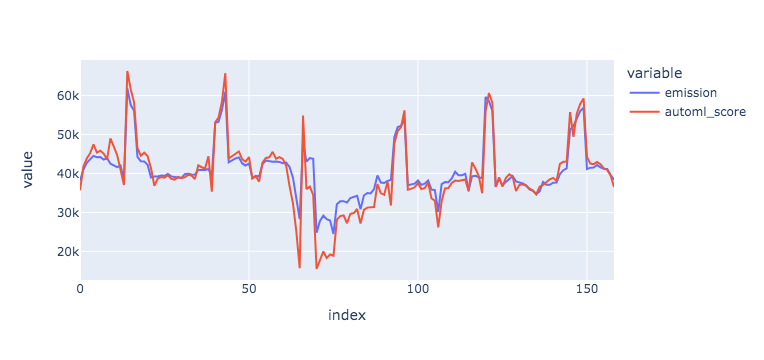

In [64]:
train_df.groupby(['year', 'week_no'])['emission','automl_score'].sum().reset_index().plot(kind='line',y=['emission', 'automl_score'])

In [65]:
test_df['date'] = pd.to_datetime(test_df['year'].astype(str)+ '-' + test_df['week_no'].astype(str) + '-2', format='%Y-%W-%w')

test_transformed = preprocessor.transform(test_df)
test_transformed = one_hot_encoder.transform(test_transformed)
test_transformed = pd.DataFrame(test_transformed, columns=[i.split('__')[1] for i in one_hot_encoder.get_feature_names_out()])

test_df['pred_emission'] = automl.predict(test_transformed)
test_df['pred_emission']

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24353/24353 [00:04<00:00, 5620.21it/s]


0        -1.632800
1        -4.781861
2         0.819035
3         0.921496
4         1.641255
           ...    
24348    34.956662
24349    30.954424
24350    30.582172
24351    31.085171
24352    29.964790
Name: pred_emission, Length: 24353, dtype: float64

## Submission

In [66]:
test_df['pred_emission'] = test_df['pred_emission']*1.07

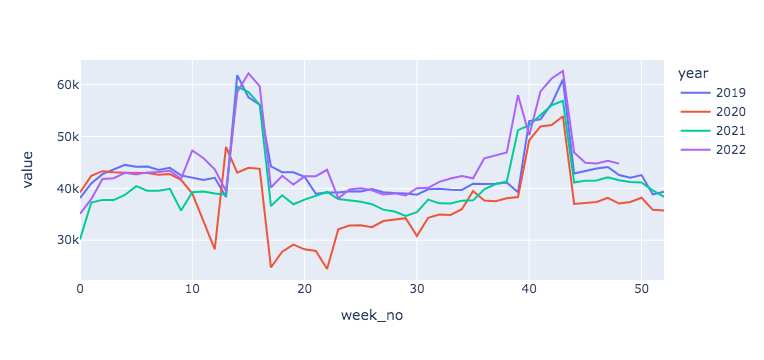

In [67]:
plot_df = pd.concat([train_df,test_df[['latitude','longitude', 'week_no','year','pred_emission']].rename({'pred_emission':'emission'},axis=1)])[['latitude','longitude', 'week_no','year','emission']]
plot_df.groupby(['year', 'week_no'])['emission'].sum().reset_index().plot(kind='line',x='week_no',y=['emission'],color='year')

### Fill zero emission in lat_long where previous is also zero

In [68]:
test_df['long_lat'] = test_df[['longitude', 'latitude']].apply(lambda x:str(x[0])+'_'+str(x[1]),axis=1)
test_df.loc[test_df['pred_emission']<=0, 'pred_emission'] = test_df[test_df['pred_emission']<=0][['long_lat','week_no']].progress_apply(lambda x:emission_max_dict.get((x[0],x[1])),axis=1)

zero_emission_dict = {k:v for k,v in emission_max_dict.items() if v==0}
test_df['pred_emission'] = test_df[['long_lat','week_no', 'pred_emission']].progress_apply(lambda x:emission_max_dict.get((x[0],x[1]), x[2]),axis=1)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24353/24353 [00:00<00:00, 97414.23it/s]


In [69]:
test_df[test_df['pred_emission']<0].shape[0]

0

In [70]:
sub_df = test_df[['ID_LAT_LON_YEAR_WEEK', 'pred_emission']].rename({'pred_emission':'emission'},axis=1)

In [71]:
sub_df.to_csv('data/automl_w_normal_feat_submission.csv',index=False)

## Thank you!